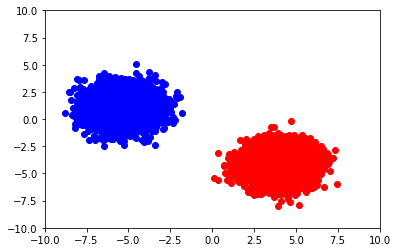

In [4]:
import numpy as np
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim 
import torch.nn.functional as F 

X, y = make_blobs(n_samples=10000, centers=2, random_state=123)

plt.figure()
labels = ['r', 'b']
for i in range(len(labels)):
    mask = (y == i)
    plt.scatter(X[mask, 0], X[mask, 1], c=labels[i])
plt.xlim(-10, 10)
plt.ylim(-10, 10)
plt.show()

# Single layer Perceptron - linear classifier

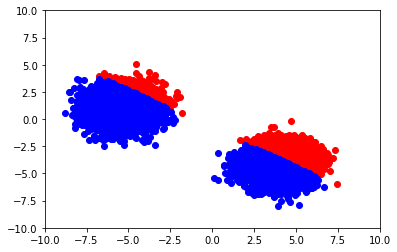

/home/sumit/.local/lib/python2.7/site-packages/torch/nn/functional.py:1474: UserWarning: Using a target size (torch.Size([10000])) that is different to the input size (torch.Size([10000, 1])) is deprecated. Please ensure they have the same size.
  "Please ensure they have the same size.".format(target.size(), input.size()))


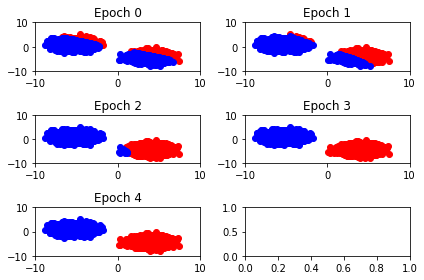

In [2]:
class Perceptron(nn.Module):
    def __init__(self):
        super(Perceptron, self).__init__()
        self.linear = nn.Linear(2,1)
    
    def forward(self, x):
        out = F.sigmoid(self.linear(x))
        return out
    
net = Perceptron()
x_tensor = torch.FloatTensor(X)
y_tensor = torch.FloatTensor(y)
criterion = nn.BCELoss()
optimizer = optim.SGD(net.parameters(), lr=0.1, momentum=0.9)


out = net(x_tensor)
figure = plt.figure()
for i in range(len(labels)):
    mask = ((out>=0.5).squeeze()).numpy() == i
    plt.scatter(X[mask, 0], X[mask, 1], c=labels[i])
plt.xlim(-10, 10)
plt.ylim(-10, 10)
plt.show()
    
epochs = 5
f, ax = plt.subplots(epochs/2+epochs%2,2)
for i in range(epochs):
    optimizer.zero_grad()
    out = net(x_tensor)
    loss = criterion(out, y_tensor)
    loss.backward()
    optimizer.step()
    for j in range(len(labels)):
        mask = ((out>=0.5).squeeze()).numpy() == j
        ax[i/2 , i%2].scatter(X[mask, 0], X[mask, 1], c=labels[j])
        ax[i/2 , i%2].set_xticks([-10, 0, 10])
        ax[i/2 , i%2].set_yticks([-10, 0, 10])
        ax[i/2 , i%2].set_title('Epoch ' + str(i))
    
f.tight_layout()
plt.show()
    
    
    
    

# Problems with single layer perceptron - When data is not linearly separable

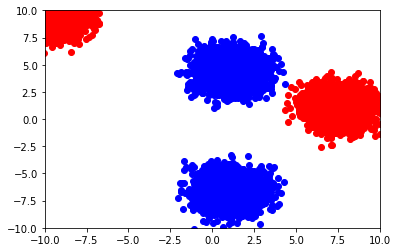

In [5]:

X, y = make_blobs(n_samples=10000, centers=4, random_state=45335)
y[y ==2] = 0
y[y > 0] = 1
plt.figure()
labels = ['r', 'b']
for i in range(len(labels)):
    mask = (y == i)
    plt.scatter(X[mask, 0], X[mask, 1], c=labels[i])
plt.xlim(-10, 10)
plt.ylim(-10, 10)
plt.show()

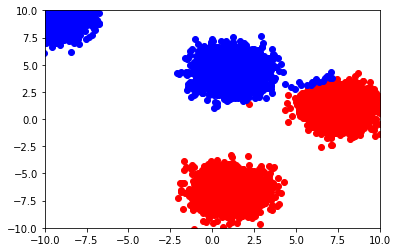

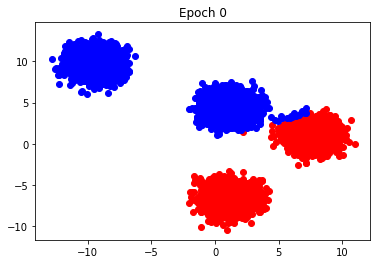

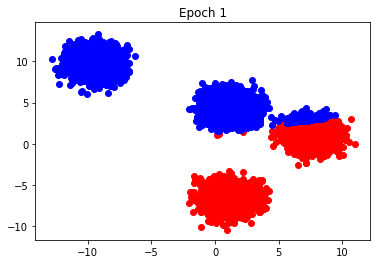

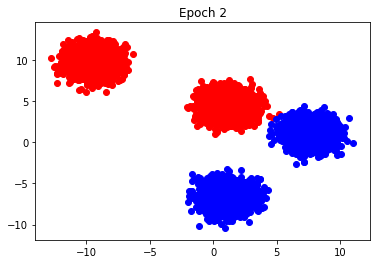

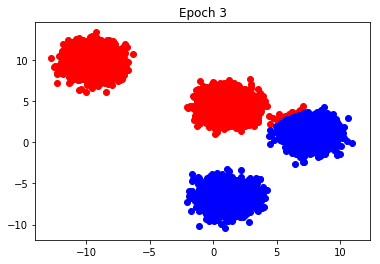

...

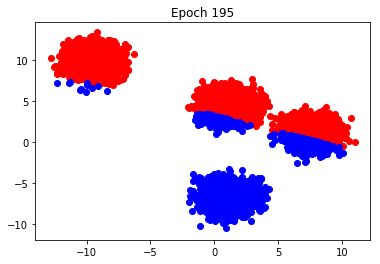

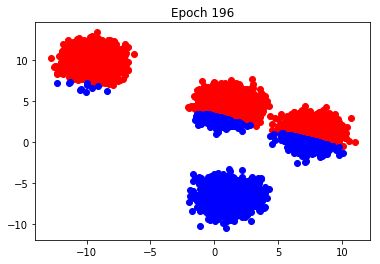

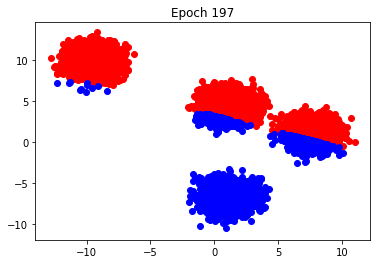

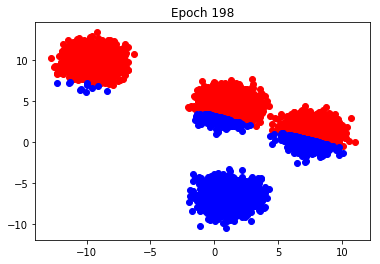

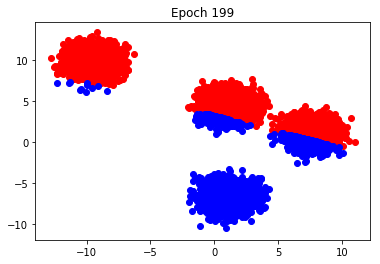

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim 
import torch.nn.functional as F 
class Perceptron(nn.Module):
    def __init__(self):
        super(Perceptron, self).__init__()
        self.linear = nn.Linear(2,1)
    
    def forward(self, x):
        out = F.sigmoid(self.linear(x))
        return out
    
net = Perceptron()
x_tensor = torch.FloatTensor(X)
y_tensor = torch.FloatTensor(y)
criterion = nn.BCELoss()
optimizer = optim.SGD(net.parameters(), lr=0.1, momentum=0.9)


out = net(x_tensor)
figure = plt.figure()
for i in range(len(labels)):
    mask = ((out>=0.5).squeeze()).numpy() == i
    plt.scatter(X[mask, 0], X[mask, 1], c=labels[i])
plt.xlim(-10, 10)
plt.ylim(-10, 10)
plt.show()
    
epochs = 200

for i in range(epochs):
    optimizer.zero_grad()
    out = net(x_tensor)
    loss = criterion(out, y_tensor)
    loss.backward()
    optimizer.step()
    for j in range(len(labels)):
        mask = ((out>=0.5).squeeze()).numpy() == j
        plt.scatter(X[mask, 0], X[mask, 1], c=labels[j])
        plt.title('Epoch ' + str(i))
  
    plt.show()
    
    

# Multilayer perceptron with linear activation : nothing but linear classifier

In [5]:
# The best this network can achieve is a linear decision boundary
# If you compare the results after few 100 epochs, 
# you will notice it converges to the one given by Single layer perceptron, 
# as it is the best this network can achieve as a linear classifier

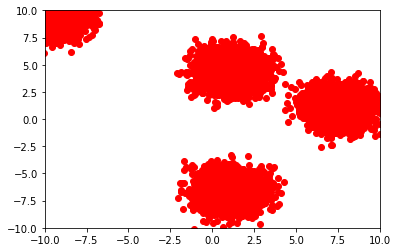

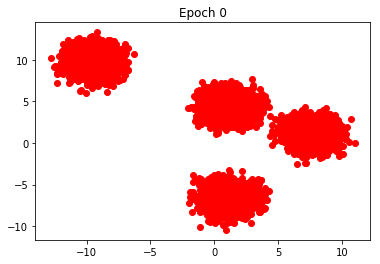

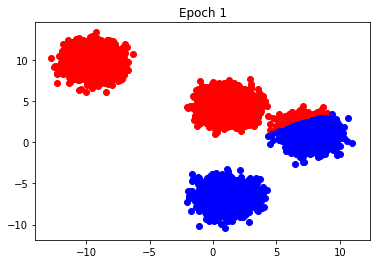

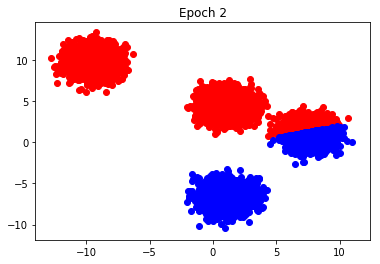

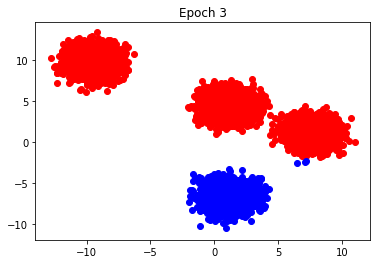

...

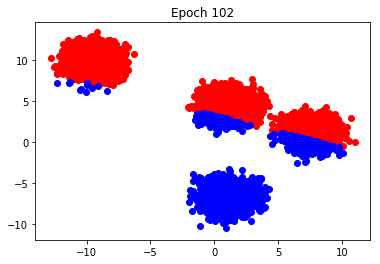

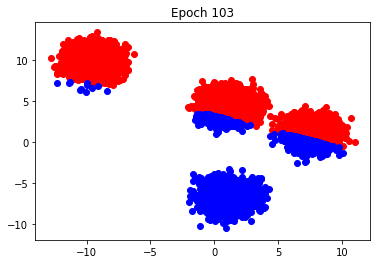

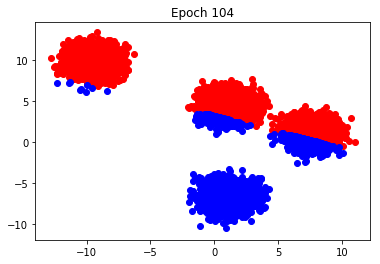

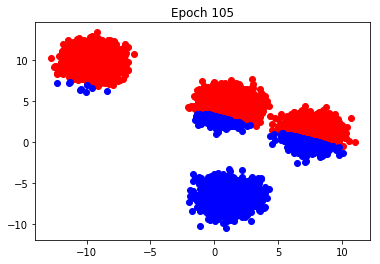

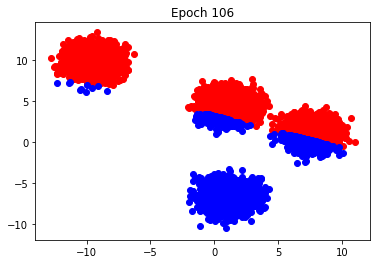

KeyboardInterrupt: 

In [7]:
class MultilayerPerceptron_Linear(nn.Module):
    def __init__(self):
        super(MultilayerPerceptron_Linear, self).__init__()
        self.linear1 = nn.Linear(2,200)
        self.linear2 = nn.Linear(200,100)
        self.linear3 = nn.Linear(100,2)
        self.linear4 = nn.Linear(2,1)
    def forward(self, x):
        layer1 = self.linear1(x)
        layer2 = self.linear2(layer1)
        layer3 = self.linear3(layer2)
        out = F.sigmoid(self.linear4(layer3))
        return out
    
net = MultilayerPerceptron_Linear()
x_tensor = torch.FloatTensor(X)
y_tensor = torch.FloatTensor(y)
criterion = nn.BCELoss()
optimizer = optim.SGD(net.parameters(), lr=0.1, momentum=0.9)


out = net(x_tensor)
figure = plt.figure()
for i in range(len(labels)):
    mask = ((out>=0.5).squeeze()).numpy() == i
    plt.scatter(X[mask, 0], X[mask, 1], c=labels[i])
plt.xlim(-10, 10)
plt.ylim(-10, 10)
plt.show()
    
epochs = 1000

for i in range(epochs):
    optimizer.zero_grad()
    out = net(x_tensor)
    loss = criterion(out, y_tensor)
    loss.backward()
    optimizer.step()
    for j in range(len(labels)):
        mask = ((out>=0.5).squeeze()).numpy() == j
        plt.scatter(X[mask, 0], X[mask, 1], c=labels[j])
        plt.title('Epoch ' + str(i))
  
    plt.show()

# Multilayer Perceptron with Nonlinear activation function - Non linear classifier

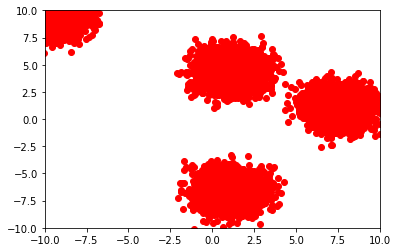

In [25]:
class MultilayerPerceptron_Nonlinear(nn.Module):
    def __init__(self):
        super(MultilayerPerceptron_Nonlinear, self).__init__()
        self.linear1 = nn.Linear(2,200)
        self.linear2 = nn.Linear(200,100)
        self.linear3 = nn.Linear(100,2)
        self.linear4 = nn.Linear(2,1)
    def forward(self, x):
        layer1 = F.sigmoid(self.linear1(x))
        layer2 = F.sigmoid(self.linear2(layer1))
        layer3 = F.sigmoid(self.linear3(layer2))
        out = F.sigmoid(self.linear4(layer3))
        return layer3, out
    
net = MultilayerPerceptron_Nonlinear()
x_tensor = torch.FloatTensor(X)
y_tensor = torch.FloatTensor(y)
criterion = nn.BCELoss()
optimizer = optim.SGD(net.parameters(), lr=0.1, momentum=0.9)


layer3, out = net(x_tensor)
figure = plt.figure()
for i in range(len(labels)):
    mask = ((out>=0.5).squeeze()).numpy() == i
    plt.scatter(X[mask, 0], X[mask, 1], c=labels[i])
plt.xlim(-10, 10)
plt.ylim(-10, 10)
plt.show()
    

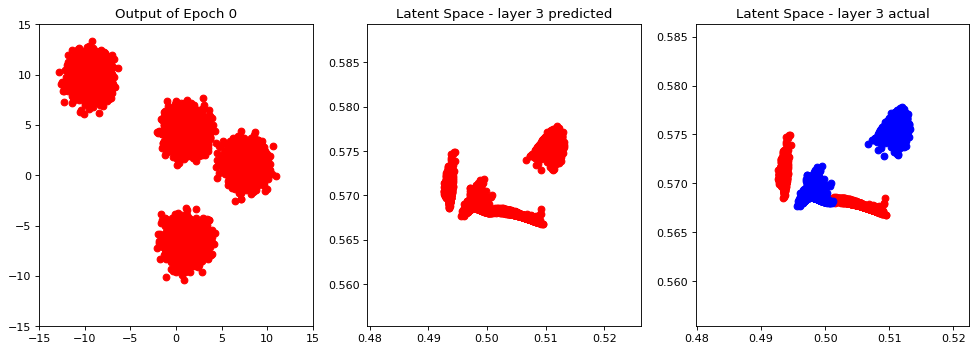

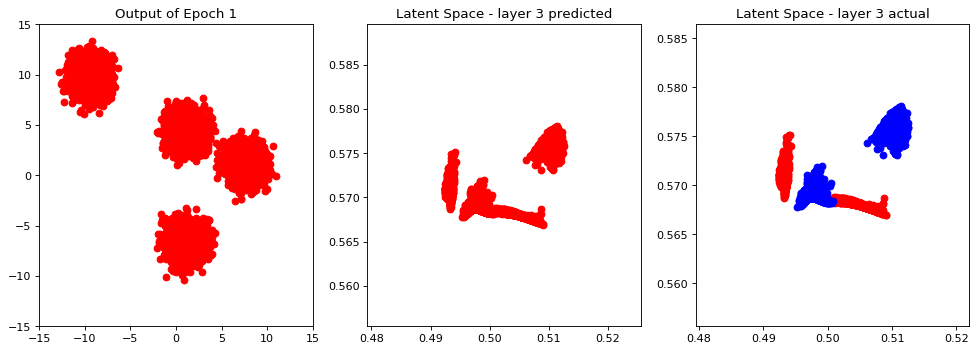

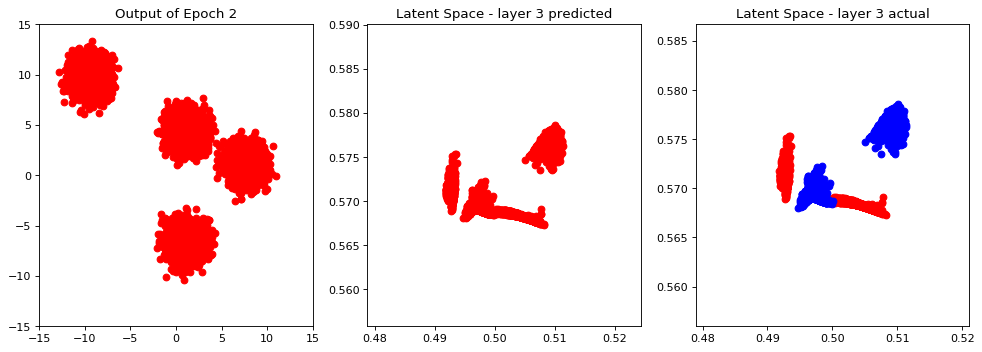

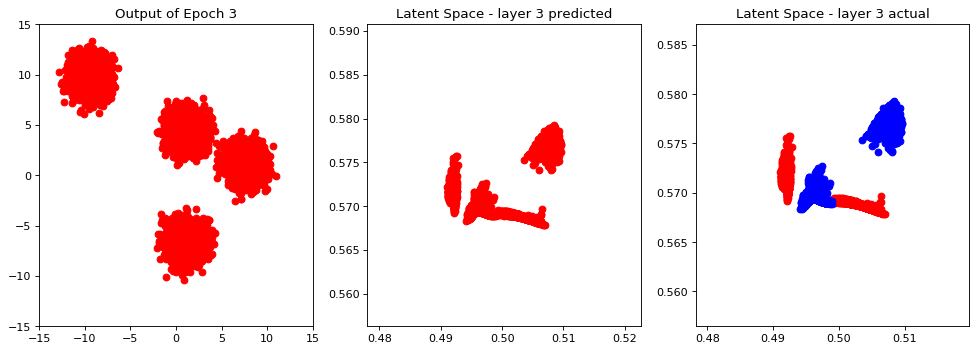

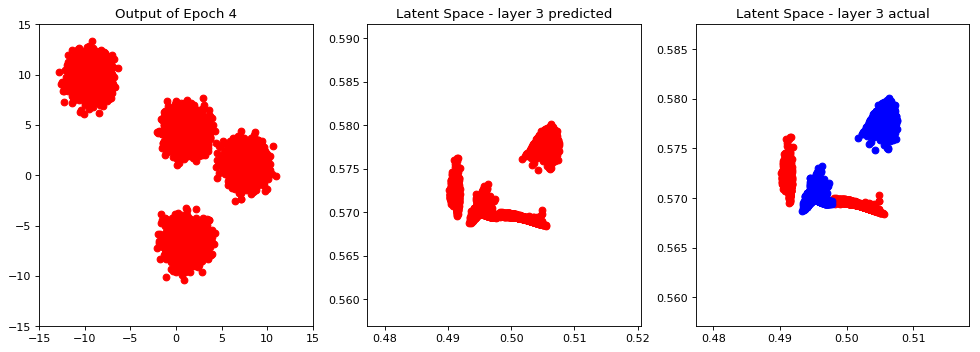

...

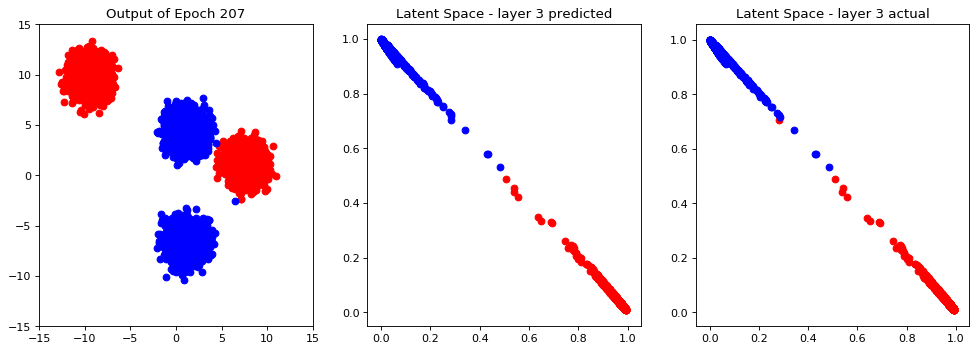

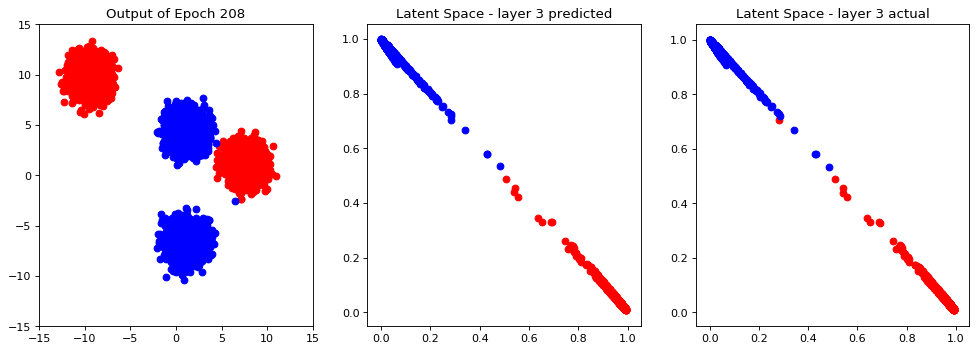

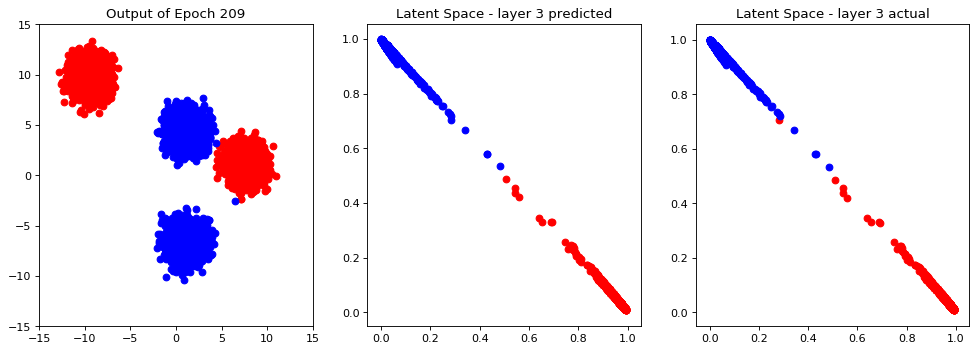

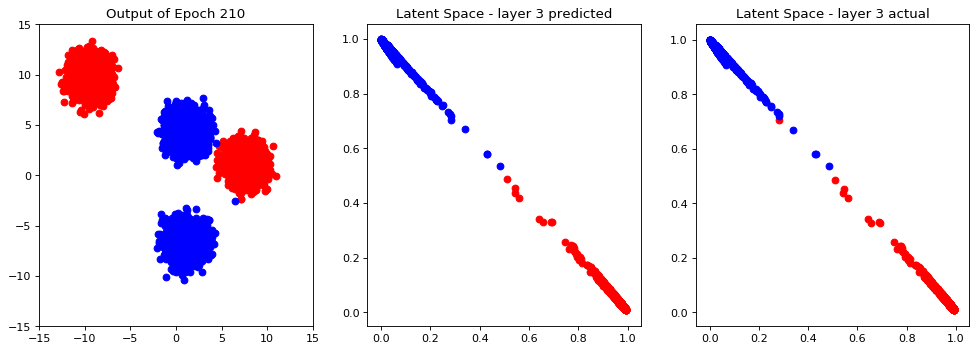

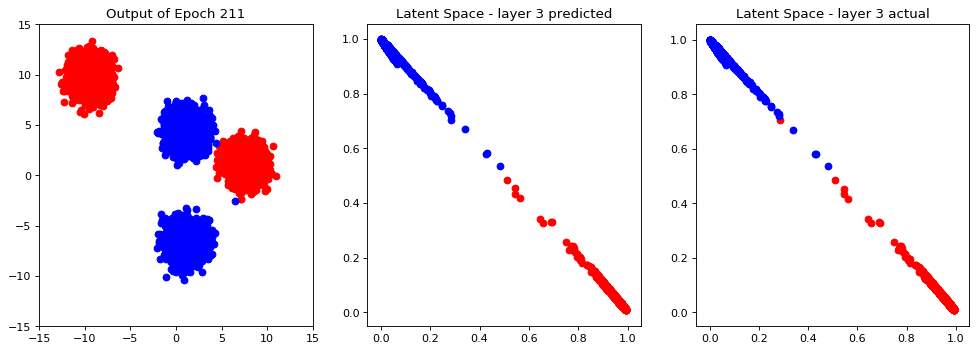

KeyboardInterrupt: 

In [26]:

epochs = 1000

for i in range(epochs):
    optimizer.zero_grad()
    layer3, out = net(x_tensor)
    layer3np = layer3.detach().numpy()
    loss = criterion(out, y_tensor)
    loss.backward()
    optimizer.step()
    
    plt.figure(num=None, figsize=(15, 5), dpi=80, facecolor='w', edgecolor='k')
    for j in range(len(labels)):
        mask = ((out>=0.5).squeeze()).numpy() == j
        plt.subplot(131)
        plt.scatter(X[mask, 0], X[mask, 1], c=labels[j])
        plt.title('Output of Epoch ' + str(i))
        plt.xlim(-15,15)
        plt.ylim(-15,15)
        plt.subplot(132)
        plt.scatter(layer3np[mask, 0], layer3np[mask, 1], c=labels[j])
        plt.title('Latent Space - layer 3 predicted')
        plt.subplot(133)
        latent_mask = (y == j)
        plt.scatter(layer3np[latent_mask, 0], layer3np[latent_mask, 1], c=labels[j])
        plt.title('Latent Space - layer 3 actual')
  
    plt.show()